In [1]:
from tensorflow import lite
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import pandas as pd
import random, os
import shutil
import time
import itertools
import pathlib
import matplotlib.pyplot as plt 
from matplotlib.image import imread

from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.metrics import categorical_accuracy 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers, models
from torch import nn


# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
save_path = "C:/Users/Aum Sathwara/Documents/Aum/Workplace/Python/PROJECTS/Deep Learning Project"
custome_model_weights = "conv2d-Diabetic Retinopathy Detection-weights.h5"

In [3]:
data_dir = "F:/Deep Learning/Diabetic Retinopathy/gaussian_filtered_images/gaussian_filtered_images"
filepaths = []
labels = []

In [4]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [5]:
folds = os.listdir(data_dir)
print(folds)

['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']


In [6]:
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    if pathlib.Path(foldpath).suffix == "":
        filelist = os.listdir(foldpath)
        
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            filepaths.append(fpath)
#             print(filepaths)
            labels.append(fold)
#             print(labels)

In [7]:
Fseries = pd.Series(filepaths, name = "filepaths")
Lseries = pd.Series(labels, name="labels")
df = pd.concat([Fseries, Lseries], axis=1)

In [8]:
print(df)

                                              filepaths  labels
0     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
1     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
2     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
3     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
4     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
...                                                 ...     ...
3657  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3658  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3659  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3660  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3661  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe

[3662 rows x 2 columns]


In [9]:
train_df, dummy_df = train_test_split(df, train_size=0.8 , shuffle= True, random_state=123)
valid_df, test_df = train_test_split(dummy_df, train_size=0.6, shuffle=True, random_state= 123)

In [10]:
batch_size = 32
img_size = (224,224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

In [11]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length+1) if ts_length%n == 0 and ts_length/n <=80]))
test_steps = ts_length // test_batch_size

In [12]:
def scaler(img):
    return img

In [13]:
tr_gen = ImageDataGenerator(preprocessing_function=scaler)
ts_gen = ImageDataGenerator(preprocessing_function=scaler)

In [14]:
train_gen = tr_gen.flow_from_dataframe(dataframe=train_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='categorical', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 2929 validated image filenames belonging to 5 classes.


In [15]:
valid_gen = ts_gen.flow_from_dataframe(dataframe=valid_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='categorical', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 439 validated image filenames belonging to 5 classes.


In [16]:
test_gen = ts_gen.flow_from_dataframe(dataframe=test_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='categorical', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 294 validated image filenames belonging to 5 classes.


In [17]:
g_dict = train_gen.class_indices
classes = list(g_dict.keys())
images, labels = next(train_gen)

In [18]:
length = len(labels)
sample = min(length, 25) 

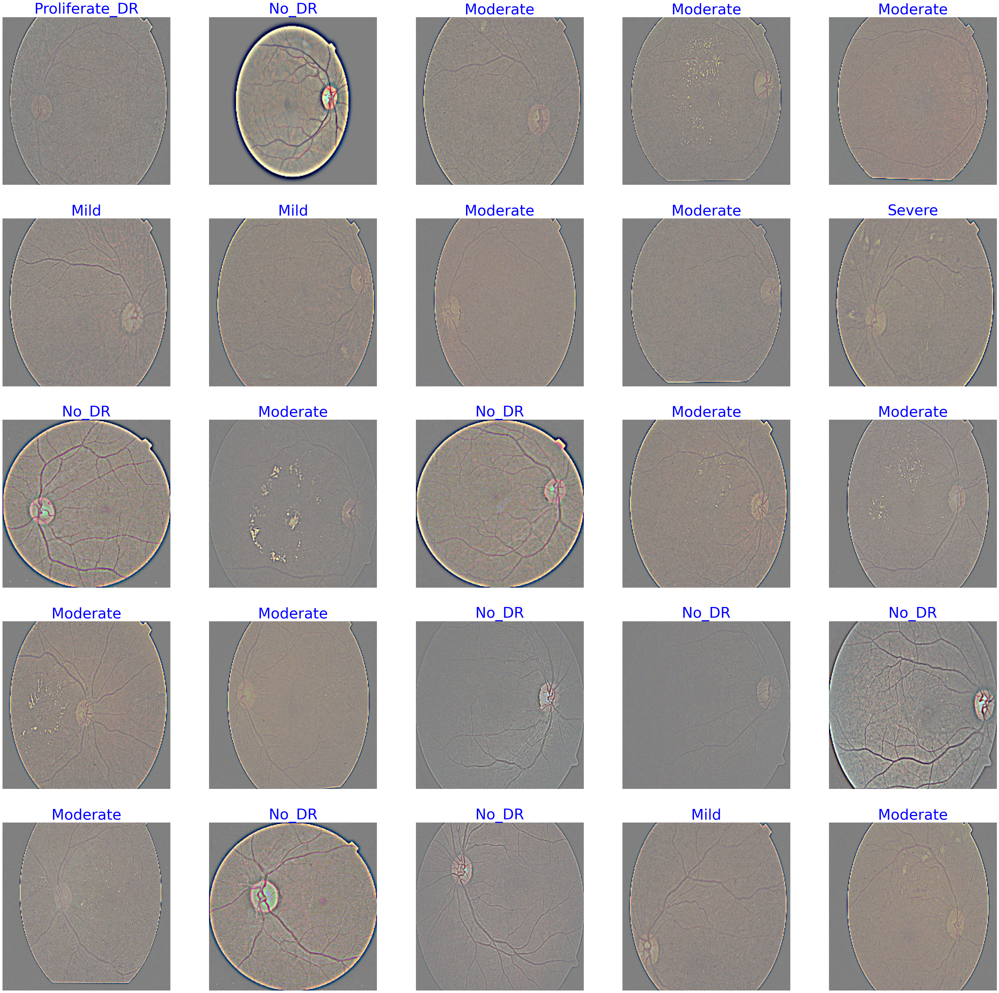

In [19]:
plt.figure(figsize= (50,50))
for i in range(sample):
    plt.subplot(5,5, i + 1)
    image = images[i] / 255    # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 41)
    plt.axis('off')
plt.show()

In [20]:
class MyCallback(keras.callbacks.Callback):
    def __init__(self, model, patience, stop_patience, threshold, factor, batches, epoches, ask_epoch):
        super(MyCallback, self).__init__()
        self.model = model
        self.patience = patience
        self.stop_patience = stop_patience
        self.threshold = threshold
        self.factor = factor
        self.batches = batches
        self.epoches = epoches
        self.ask_epoch = ask_epoch
        
        self.ask_epoch_intial = ask_epoch
        
        
        self.count = 0 
        self.stop_count = 0
        self.best_epoch = 1
        self.initial_lr = float(tf.keras.backend.get_value(model.optimizer.lr))
        self.highest_tracc = 0.0
        self.lowest_vloss = np.inf
        self.best_weights = self.model.get_weights()
        self.initial_weights = self.model.get_weights()
        
    def on_train_begin(self, logs = None):
        msg = "Do you want model asks you to halt the training [y/n]"
        print(msg)
        ans = input('')
        if ans in ['Y', 'y']:
            self.ask_permission = 1
        elif ans in ['N', 'n']:
            self.ask_permission = 0
    
        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print(msg)
        self.start_time = time.time()
        
    def on_train_end(self, logs = None):
        stop_time = time.time()
        tr_duration = stop_time - self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)
        self.model.set_weights(self.best_weights)
    

    def on_train_batch_end(self, batch, logs= None):
        acc = logs.get('accuracy') * 100
        loss = logs.get('loss')

        msg = '{0:20s}processing batch {1:} of {2:5s}-   accuracy=  {3:5.3f}   -   loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end= '')
        
    def on_epoch_begin(self, epoch, logs= None):
        self.ep_start = time.time()
        
    
    def on_epoch_end(self, epoch, logs= None):
        ep_end = time.time()
        duration = ep_end - self.ep_start

        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr)) 
        current_lr = lr
        acc = logs.get('accuracy')  
        v_acc = logs.get('val_accuracy')  
        loss = logs.get('loss') 
        v_loss = logs.get('val_loss')  
        
        if acc < self.threshold: 
            monitor = 'accuracy'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (acc - self.highest_tracc ) * 100 / self.highest_tracc 
                
            if acc > self.highest_tracc:
                self.highest_tracc = acc 
                self.best_weights = self.model.get_weights() 
                self.count = 0 
                self.stop_count = 0
                if v_loss < self.lowest_vloss:
                    self.lowest_vloss = v_loss
                self.best_epoch = epoch + 1 
           
            else:
                
                if self.count >= self.patience - 1:
                    lr = lr * self.factor 
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                    self.count = 0 
                    self.stop_count = self.stop_count + 1
                    self.count = 0 
                    if v_loss < self.lowest_vloss:
                        self.lowest_vloss = v_loss
                else:
                    self.count = self.count + 1 
        
        else: 
            monitor = 'val_loss'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (self.lowest_vloss - v_loss ) * 100 / self.lowest_vloss
                
            if v_loss < self.lowest_vloss: 
                self.lowest_vloss = v_loss 
                self.best_weights = self.model.get_weights() 
                self.count = 0 # 
                self.stop_count = 0
                self.best_epoch = epoch + 1 
            
            else: 
                if self.count >= self.patience - 1: 
                    lr = lr * self.factor 
                    self.stop_count = self.stop_count + 1
                    self.count = 0 
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                
                else:
                    self.count = self.count + 1 

                if acc > self.highest_tracc:
                    self.highest_tracc = acc
        
        msg = f'{str(epoch + 1):^3s}/{str(self.epoches):4s} {loss:^9.3f}{acc * 100:^9.3f}{v_loss:^9.5f}{v_acc * 100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print(msg)
        
        if self.stop_count > self.stop_patience - 1:
            msg = f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print(msg)
            self.model.stop_training = True 
            
        else:
            if self.ask_epoch != None and self.ask_permission != 0:
                if epoch + 1 >= self.ask_epoch:
                    msg = 'enter H to halt training or an integer for number of epoches to run then ask again'
                    print(msg)

                    ans = input('')
                    if ans == 'H' or ans == 'h':
                        msg = f'training has been halted at epoch {epoch + 1} due to user input'
                        print(msg)
                        self.model.stop_training = True 
                    
                    else:
                        try:
                            ans = int(ans)
                            self.ask_epoch += ans
                            msg = f' training will continue until epoch {str(self.ask_epoch)}'
                            print(msg)
                            msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor', '% Improv', 'Duration')
                            print(msg)

                        except Exception:
                            print('Invalid')

In [21]:
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys()))

In [22]:
# base_model = tf.keras.applications.efficientnet.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

# model_x = CNN()
model = models.Sequential()
# model.add(model_x)
model.add(layers.Conv2D(32, (3,3), activation='relu', input_shape=img_shape))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())

model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))  
model.add(layers.Dense(class_count, activation='softmax'))

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 26, 26, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 86528)             0

In [23]:
batch_size = 8  # set batch size for training
epochs = 40   # number of all epochs in training
patience = 1   #number of epochs to wait to adjust lr if monitored value does not improve
stop_patience = 3   # number of epochs to wait before stopping training if monitored value does not improve
threshold = 0.9   # if train accuracy is < threshold adjust monitor accuracy, else monitor validation loss
factor = 0.5   # factor to reduce lr by
ask_epoch = 5   # number of epochs to run before asking if you want to halt training
batches = int(np.ceil(len(train_gen.labels) / batch_size))    # number of training batch to run per epoch

callbacks = [MyCallback(model= model, patience= patience, stop_patience= stop_patience, threshold= threshold,
            factor= factor, batches= batches, epoches= epochs, ask_epoch= ask_epoch )]

In [24]:
history = model.fit(x= train_gen, epochs= epochs, verbose= 0, callbacks= callbacks,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)

Do you want model asks you to halt the training [y/n]
n
 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration
 1 /40    11.082   63.059   0.80988  70.387   0.00100  0.00100  accuracy     0.00    169.99 
 2 /40     0.870   70.434   0.77211  72.665   0.00100  0.00100  accuracy    11.69    82.40  
 3 /40     0.826   71.321   0.74933  71.754   0.00100  0.00100  accuracy     1.26    84.78  
 4 /40     0.779   72.448   0.72288  74.032   0.00100  0.00100  accuracy     1.58    82.64  
 5 /40     0.759   74.155   0.69637  74.032   0.00100  0.00100  accuracy     2.36    89.38  
 6 /40     0.714   74.906   0.68746  73.121   0.00100  0.00100  accuracy     1.01    85.92  
 7 /40     0.686   75.452   0.68452  73.121   0.00100  0.00100  accuracy     0.73    82.72  
 8 /40     0.660   76.033   0.70123  73.121   0.00100  0.00100  accuracy     0.77    82.71  
 9 /40     0.615   77.228   0.70674  73.121   0.00100  0.00100  accuracy     1.57    84.61  
10 /40     0.58

In [25]:
efficient_net_b3_custom = tf.keras.applications.EfficientNetB3(
    include_top=False, input_shape=img_shape, weights= "imagenet"
)

# # Freeze the pre-trained weights (optional)
for layer in efficient_net_b3_custom.layers:
    layer.trainable = False

custom_model_2 = tf.keras.Sequential()
custom_model_2.add(efficient_net_b3_custom)
custom_model_2.add(layers.Reshape((7, 7, 1536), input_shape=img_shape))
# custom_model_2.add(layers.Conv2DTranspose(256, kernel_size=(3, 3), strides=(32, 32), padding='valid', activation='relu'))
custom_model_2.add(layers.Conv2DTranspose(512, kernel_size=(3, 3), strides=(31, 31), activation='relu'))
custom_model_2.add(layers.Conv2DTranspose(256, kernel_size=(3, 3), activation='relu'))
custom_model_2.add(layers.Conv2DTranspose(128,kernel_size=(2,2), activation='relu'))
custom_model_2.add(layers.Conv2DTranspose(64,kernel_size=(2,2), activation='relu'))
custom_model_2.add(layers.Conv2DTranspose(32,kernel_size=(2,2), activation='relu'))

# custom_model_2.add(layers.Conv2D(32, (3,3), activation='relu', input_shape=img_shape))

# custom_model_2.add(layers.GlobalAveragePooling2D())
custom_model_2.add(model)
custom_model_2.add(layers.GlobalAveragePooling2D())
custom_model_2.add(tf.keras.layers.Dense(class_count, activation='softmax')) 
# Compile the model
custom_model_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary to inspect the model architecture
custom_model_2.summary()

ValueError: Input 0 of layer conv2d is incompatible with the layer: expected axis -1 of input shape to have value 3 but received input with shape (None, 222, 222, 32)

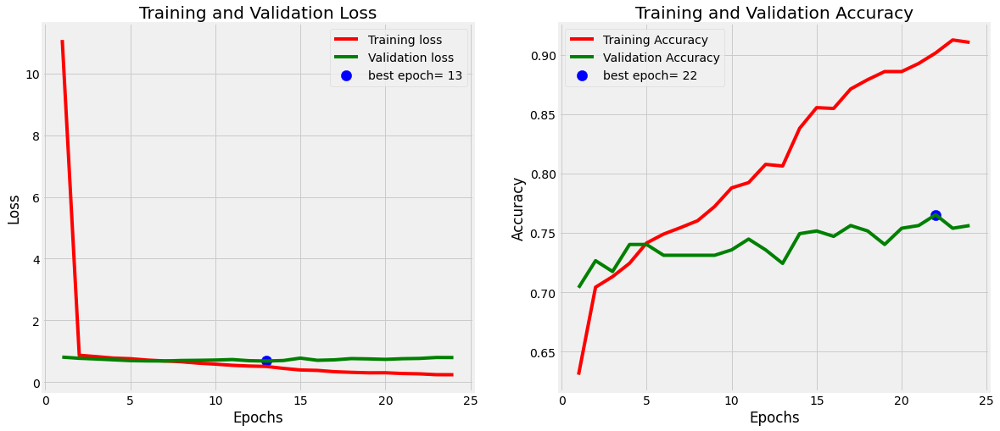

In [26]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'



plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [27]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

6/6 [==============================] - 2s 332ms/step - loss: 1.0590 - accuracy: 0.7188
Train Loss:  0.18945638835430145
Train Accuracy:  0.9479166865348816
--------------------
Validation Loss:  0.7082089781761169
Validation Accuracy:  0.78125
--------------------
Test Loss:  1.0590497255325317
Test Accuracy:  0.71875


In [28]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

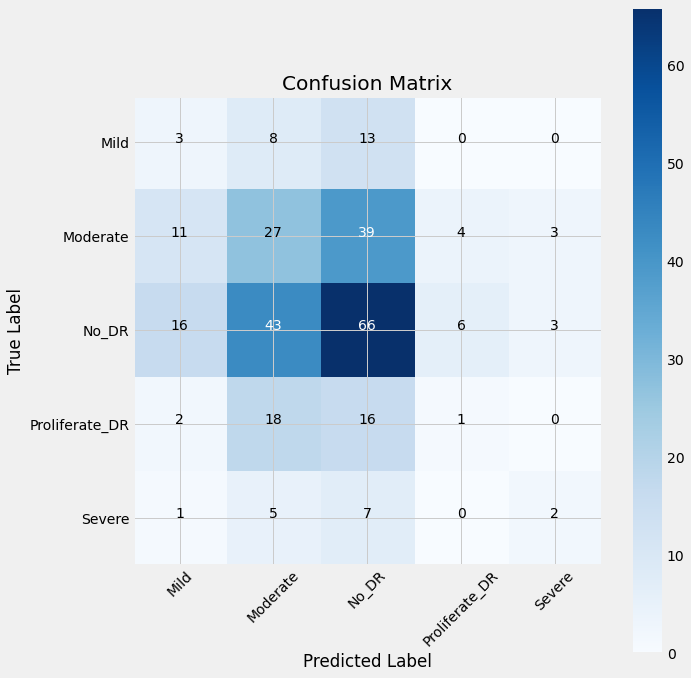

In [29]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [30]:
print(classification_report(test_gen.classes, y_pred, target_names= classes))

                precision    recall  f1-score   support

          Mild       0.09      0.12      0.11        24
      Moderate       0.27      0.32      0.29        84
         No_DR       0.47      0.49      0.48       134
Proliferate_DR       0.09      0.03      0.04        37
        Severe       0.25      0.13      0.17        15

      accuracy                           0.34       294
     macro avg       0.23      0.22      0.22       294
  weighted avg       0.32      0.34      0.32       294



In [31]:
model_name = model.input_names[0][:-6]
subject = 'Diabetic Retinopathy Detection'
acc = test_score[1] * 100

# Save model
save_id = str(f'{model_name}-{subject}-{"%.2f" %round(acc, 2)}.h5')
model_save_loc = os.path.join('', save_id)
model.save(model_save_loc)
print(f'model was saved as {model_save_loc}')

# Save weights
weight_save_id = str(f'{model_name}-{subject}-weights.h5')
weights_save_loc = os.path.join('', weight_save_id)
model.save_weights(weights_save_loc)
print(f'weights were saved as {weights_save_loc}')

model was saved as conv2d-Diabetic Retinopathy Detection-71.88.h5
weights were saved as conv2d-Diabetic Retinopathy Detection-weights.h5


In [32]:
class_dict = train_gen.class_indices
img_size = train_gen.image_shape
height = []
width = []
for _ in range(len(class_dict)):
    height.append(img_size[0])
    width.append(img_size[1])

Index_series = pd.Series(list(class_dict.values()), name= 'class_index')
Class_series = pd.Series(list(class_dict.keys()), name= 'class')
Height_series = pd.Series(height, name= 'height')
Width_series = pd.Series(width, name= 'width')
class_df = pd.concat([Index_series, Class_series, Height_series, Width_series], axis= 1)
csv_name = f'{subject}-class_dict.csv'
csv_save_loc = os.path.join(save_path, csv_name)
class_df.to_csv(csv_save_loc, index= False)
print(f'class csv file was saved as {csv_save_loc}')

class csv file was saved as C:/Users/Aum Sathwara/Documents/Aum/Workplace/Python/PROJECTS/Deep Learning Project\Diabetic Retinopathy Detection-class_dict.csv
